# MSAI 495 - Generative AI - Project 1 | Image Generation
## Ben Benyamin

### Overview

In this project, the objective was to remove objects from images—rather than generate them—using techniques covered in class. By leveraging Variational Autoencoders (VAEs), the goal was to learn the average latent representation of each object class. This representation captures the "essence" of the class, which can then be subtracted from the image’s latent space to effectively remove the object from the reconstructed output.

The dataset used for this task was [STL-10](https://cs.stanford.edu/~acoates/stl10/), which consists of 10 object classes commonly used for unsupervised learning and representation learning tasks.

In [1]:
import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import os
import sys
import matplotlib.pyplot as plt
import numpy as np
import torch.optim as optim
from tqdm import tqdm
from torch.utils.tensorboard import SummaryWriter
from torchvision.datasets import ImageFolder
import random
from tensorboard.backend.event_processing import event_accumulator
from collections import defaultdict



parent_dir = os.path.abspath(os.path.join(os.getcwd(), '..'))

sys.path.append(os.path.join(parent_dir, 'model'))
sys.path.append(os.path.join(parent_dir, 'loss'))

from model import VAE        
from loss import VAELoss


In [2]:
## HYPERPARAMETERS

BATCH_SIZE = 64
BETA = 1
SIZES = [128,256,512,512]
LATENT_SIZE = 512
LEARNING_RATE = 1e-4
EPOCHS = 251
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

In [3]:
transform = transforms.Compose(
    [
        transforms.Resize((128,128)),
        transforms.ToTensor(),
    ]
)

In [4]:
STL10_dataset = torchvision.datasets.STL10(
    root='../data',
    download=True,
    transform=transform
)

Number of classes: 10


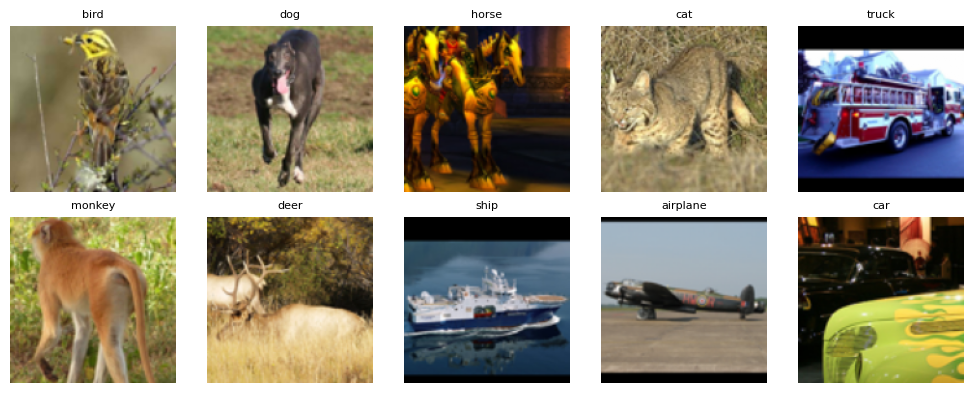

In [5]:
classes = STL10_dataset.classes
N = min(len(classes),10)
print(f"Number of classes: {len(classes)}")

# Set grid size (5 per row)
cols = N // 2
rows = (N + cols - 1) // cols  # round up

fig, axes = plt.subplots(rows, cols, figsize=(cols * 2, rows * 2))

shown_classes = set()

i = 0  # class counter
dataset_idx = 0  # dataset index

while i < N and dataset_idx < len(STL10_dataset):
    img, label = STL10_dataset[dataset_idx]
    class_name = classes[label]

    if class_name not in shown_classes:
        shown_classes.add(class_name)

        img = img.permute(1, 2, 0).numpy()
        row = i // cols
        col = i % cols
        ax = axes[row, col] if rows > 1 else axes[col]
        ax.imshow(img)
        ax.set_title(f"{class_name}", fontsize=8)
        ax.axis('off')

        i += 1

    dataset_idx += 1

plt.tight_layout()
plt.show()


In [6]:
data_loader = DataLoader(STL10_dataset, batch_size=BATCH_SIZE, shuffle=True)
input_shape = STL10_dataset[0][0].shape
print(f"Input shape : {input_shape}")

Input shape : torch.Size([3, 128, 128])


## Hyperband Tuning

Hyperband tuning was implemented according to the algorithm discussed in class, leveraging its efficient use of resources by progressively allocating more resources to promising configurations while terminating less promising ones early.

In [7]:
### HYPERBAND

ETA = 3
R = 81
s_max = int(np.floor(np.log(R) / np.log(ETA)))
B = (s_max + 1) * R
print(f"s_max: {s_max}, B: {B}")

for s in reversed(range(s_max + 1)):
    n = int(np.ceil((B / R) * (ETA**s) / (s + 1)))
    r = (int)(R * ETA**(-s))

    print(f"Bracket s={s}: n={n}, r={r}")

s_max: 4, B: 405
Bracket s=4: n=81, r=1
Bracket s=3: n=34, r=3
Bracket s=2: n=15, r=9
Bracket s=1: n=8, r=27
Bracket s=0: n=5, r=81


In [8]:
def sample_configuration():
    return {
        "batch_size": random.choice([32, 64, 128]),
        "beta": random.choice([0.1, 0.5, 1.0, 2.0]),
        "sizes": random.choice([[128,256], [256,256,256], [512,512]]),
        "latent_size": random.choice([128, 256, 512]),
        "lr": random.choice([1e-3, 1e-4, 5e-5])
    }

In [9]:
def hb_train(config, ep):

    vae = VAE(
        input_shape= input_shape,
        feature_sizes=config['sizes'],
        latent_size=config['latent_size']
    ).to(DEVICE)

    optimizer = torch.optim.Adam(vae.parameters(), lr=config['lr'])
    criterion = VAELoss(beta=config['beta'])
    hb_data_loader = DataLoader(STL10_dataset, batch_size=config['batch_size'], shuffle=True)

    vae.train()

    total_loss = 0.0
    for _ in range(ep):
        epoch_loss = 0.0
        for images, _ in hb_data_loader:
            images = images.to(DEVICE)
            optimizer.zero_grad()
            recon, mu, log_var = vae(images)
            loss, _, _ = criterion(images, recon, mu, log_var, 1.0)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()/ len(hb_data_loader)
        total_loss += epoch_loss

    return total_loss / ep  # Average


In [10]:
def hyperband_search():
    best_conf = None
    best_loss = float('inf')

    for s in reversed(range(s_max + 1)):
        n = int(np.ceil(B / R / (s + 1)) * ETA**s)
        r = R * ETA**(-s)

        T = [sample_configuration() for _ in range(n)]

        for i in range(s + 1):
            n_i = int(n * ETA**(-i))
            r_i = int(r * ETA**i)

            print(f"\n[Bracket s={s}, Round i={i}] Training {n_i} configs for {r_i} epochs")

            results = []
            for t in tqdm(T, desc=f"Configs (s={s}, i={i}, r={r_i})"):
                val_loss = hb_train(t, r_i)
                results.append((t, val_loss))

            # Sort and keep top configs
            results.sort(key=lambda x: x[1])
            T = [x[0] for x in results[:max(1, int(n_i / ETA))]]

            # Track best configuration
            if results[0][1] < best_loss:
                best_loss = results[0][1]
                best_conf = results[0][0]
                print(f"New best loss: {best_loss:.4f}")

    return best_conf, best_loss


### Note: It is taking longer than expected to search. Once it is done this notebook will be updated.

In [11]:
# best_config, best_val_loss = hyperband_search()
# print("Best config:", best_config)
# print("Best validation loss:", best_val_loss)

[OUTPUT PLACEHODLER]

In [12]:
#define the model
vae = VAE(
    input_shape = input_shape,
    feature_sizes = SIZES,
    latent_size = LATENT_SIZE
).to(DEVICE)



In [13]:
loss = VAELoss(beta= BETA)
optimizer = optim.Adam(vae.parameters(), lr=LEARNING_RATE)

In [14]:
def visualize_reconstruction(vae, data_loader, device, num_samples=1):
    vae.eval()
    with torch.no_grad():
        sample_images, _ = next(iter(data_loader))
        sample_images = sample_images[:num_samples].to(device)
        recon_samples, _, _ = vae(sample_images)

        # Prepare figure
        fig, axes = plt.subplots(2, num_samples, figsize=(num_samples * 2, 4))

        for i in range(num_samples):
            # Original
            img = sample_images[i].cpu().permute(1, 2, 0).numpy()
            axes[0, i].imshow(img)
            axes[0, i].axis('off')
            axes[0, i].set_title('Original' if i == 0 else '')

            # Reconstruction
            recon = recon_samples[i].cpu().permute(1, 2, 0).numpy()
            axes[1, i].imshow(recon)
            axes[1, i].axis('off')
            axes[1, i].set_title('Reconstruction' if i == 0 else '')

        plt.tight_layout()
        plt.show()

def save_checkpoint(state, filename='vae_checkpoint.pth'):
    torch.save(state, filename)
    print(f"Checkpoint saved to {filename}")

Epoch [1/251] Avg Loss: 2683.8625


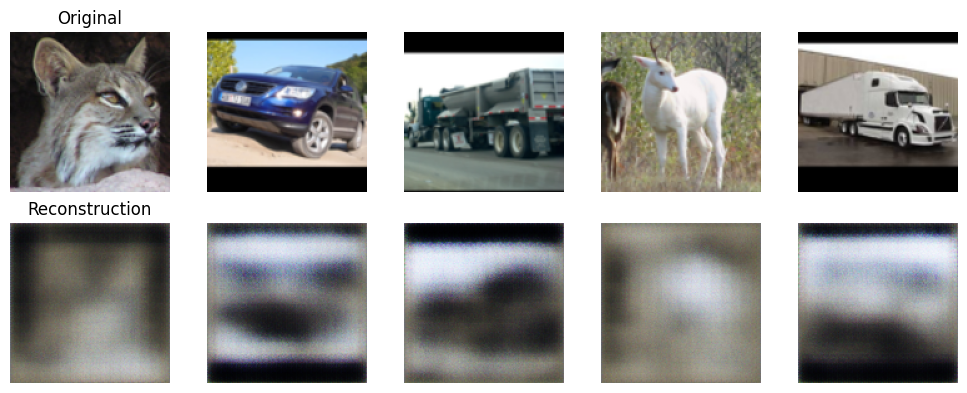

Checkpoint saved to vae_checkpoint.pth


Epoch [11/251] Avg Loss: 1009.9834


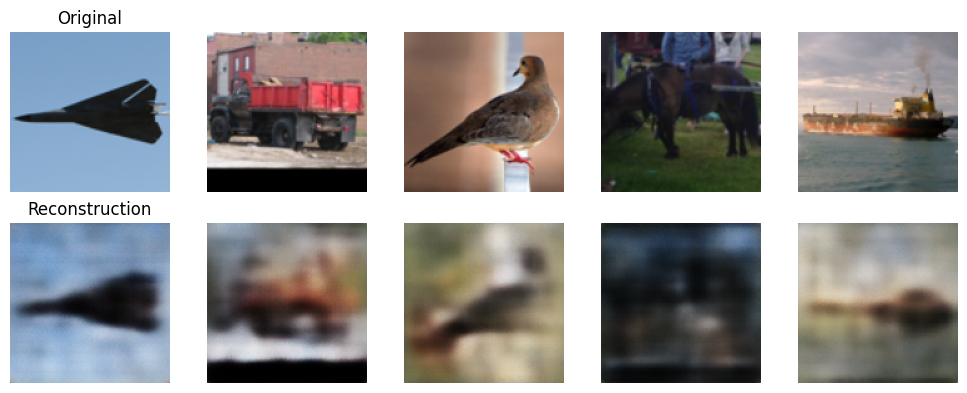

Checkpoint saved to vae_checkpoint.pth


Epoch [21/251] Avg Loss: 864.5195


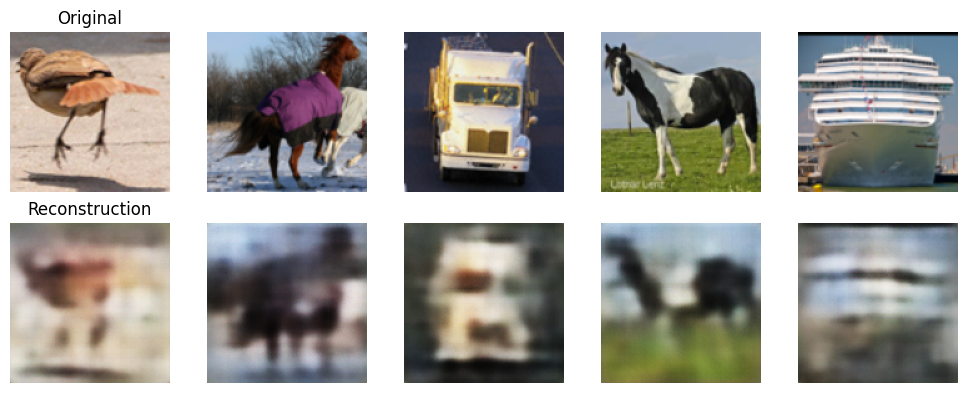

Checkpoint saved to vae_checkpoint.pth


Epoch [31/251] Avg Loss: 799.5006


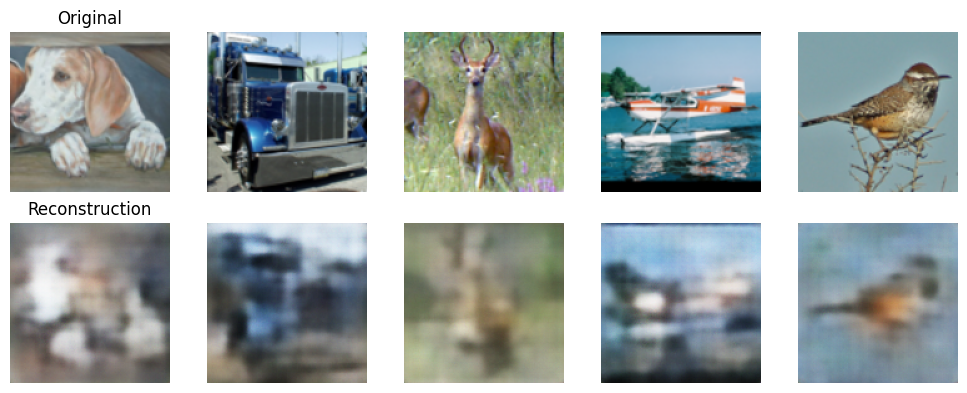

Checkpoint saved to vae_checkpoint.pth


Epoch [41/251] Avg Loss: 760.8768


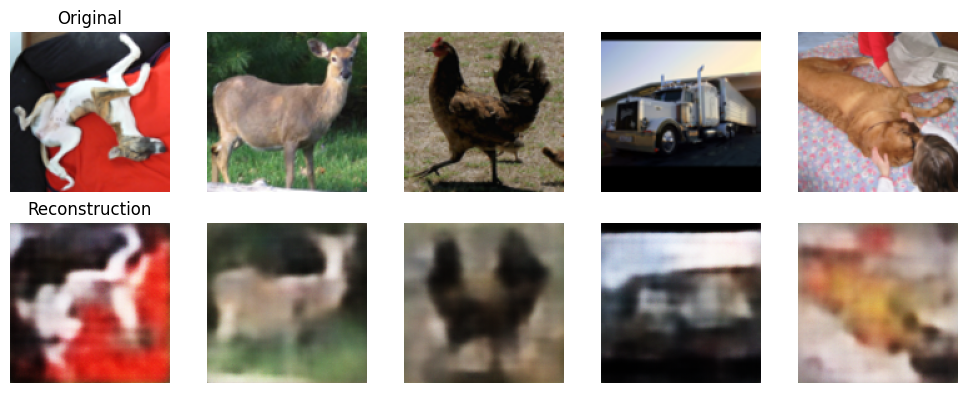

Checkpoint saved to vae_checkpoint.pth


Epoch [51/251] Avg Loss: 732.5545


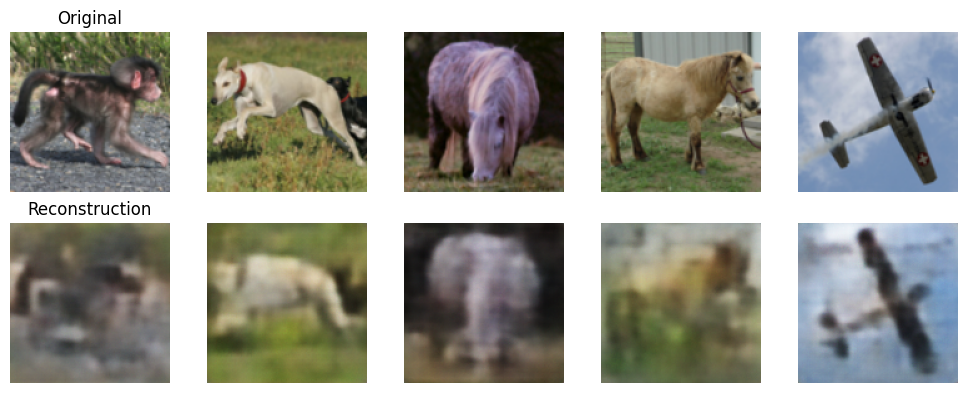

Checkpoint saved to vae_checkpoint.pth


Epoch [61/251] Avg Loss: 712.7431


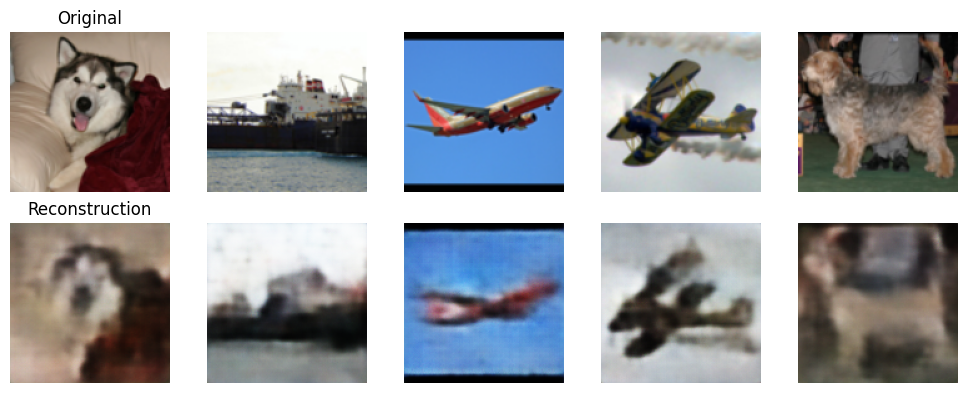

Checkpoint saved to vae_checkpoint.pth


Epoch [71/251] Avg Loss: 702.3457


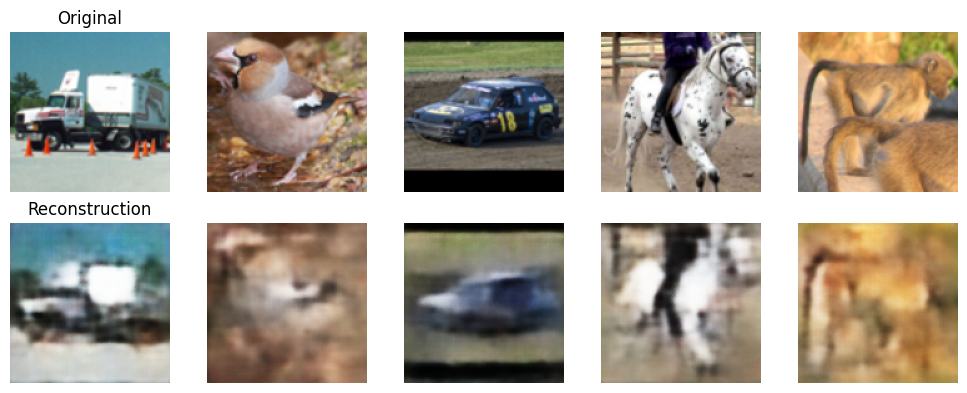

Checkpoint saved to vae_checkpoint.pth


Epoch [81/251] Avg Loss: 679.1238


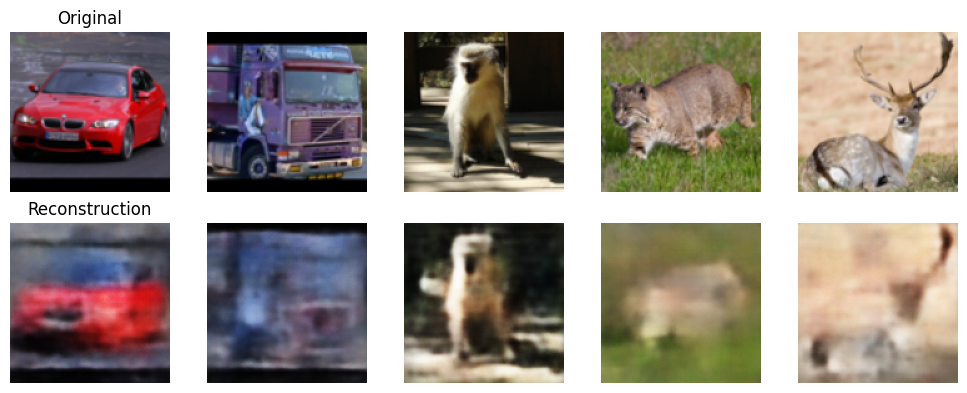

Checkpoint saved to vae_checkpoint.pth


Epoch [91/251] Avg Loss: 650.7540


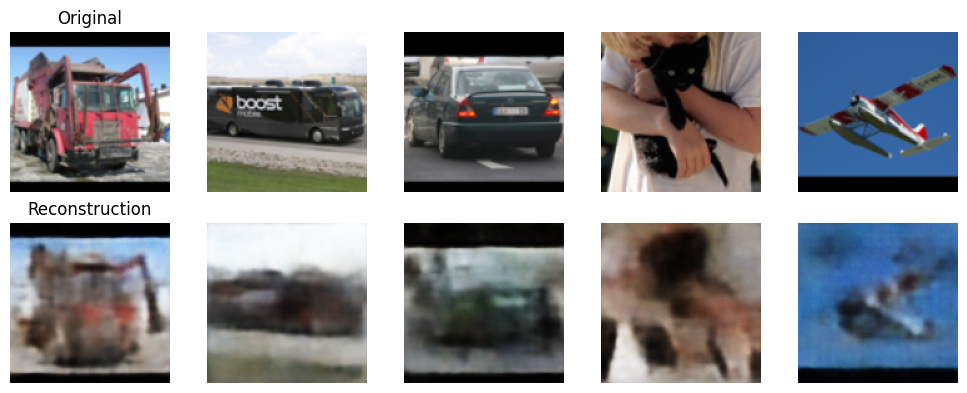

Checkpoint saved to vae_checkpoint.pth


Epoch [101/251] Avg Loss: 636.4753


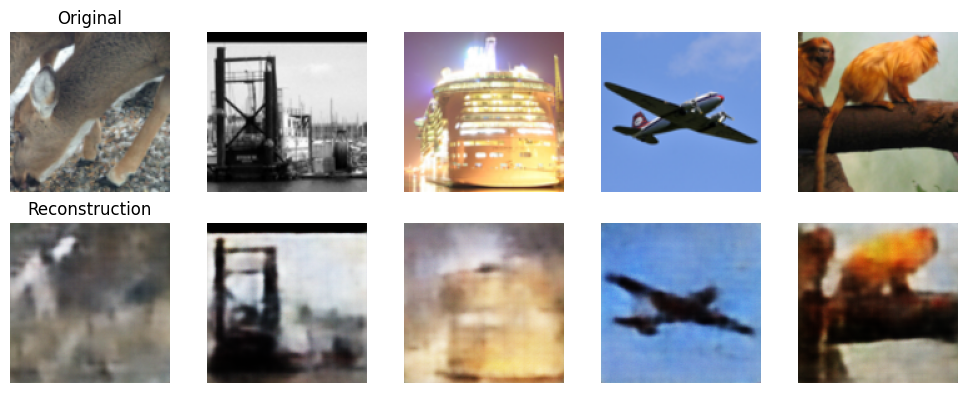

Checkpoint saved to vae_checkpoint.pth


Epoch [111/251] Avg Loss: 610.8554


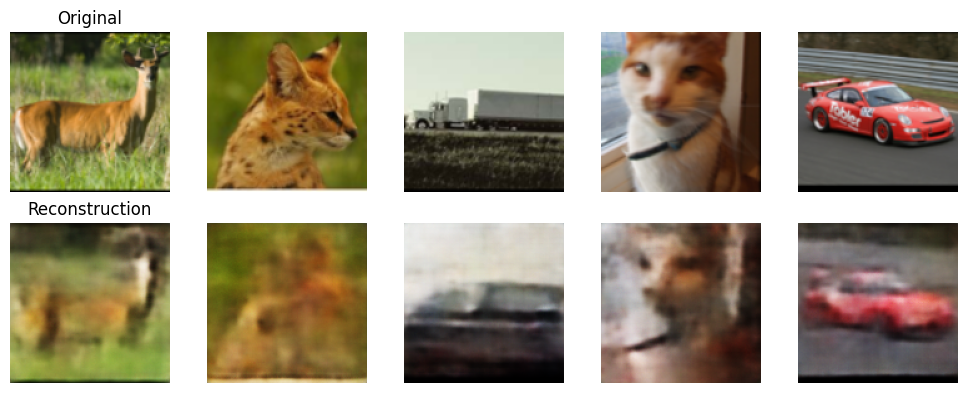

Checkpoint saved to vae_checkpoint.pth


Epoch [121/251] Avg Loss: 600.2406


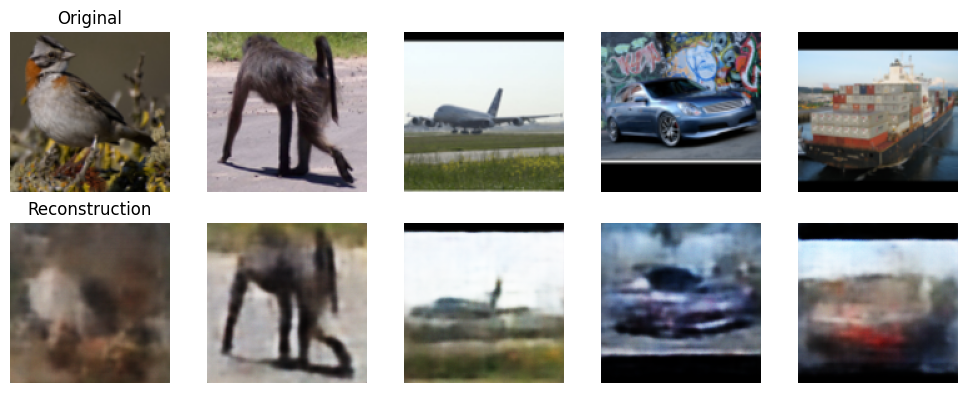

Checkpoint saved to vae_checkpoint.pth


Epoch [131/251] Avg Loss: 589.7112


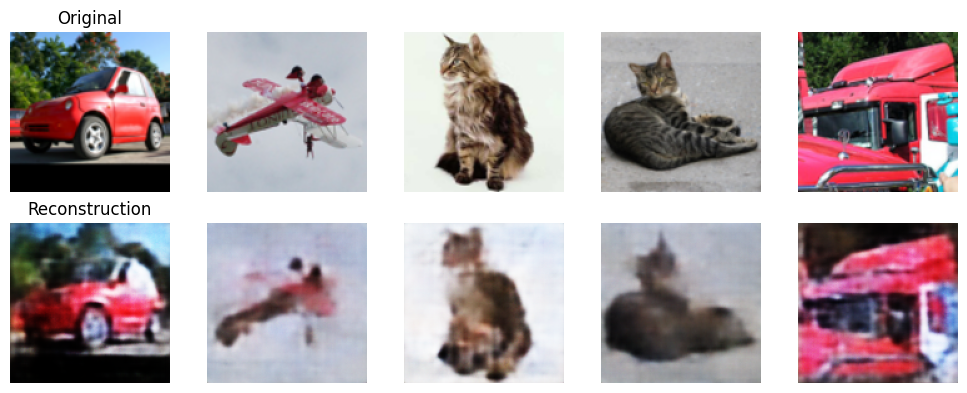

Checkpoint saved to vae_checkpoint.pth


Epoch [141/251] Avg Loss: 580.8691


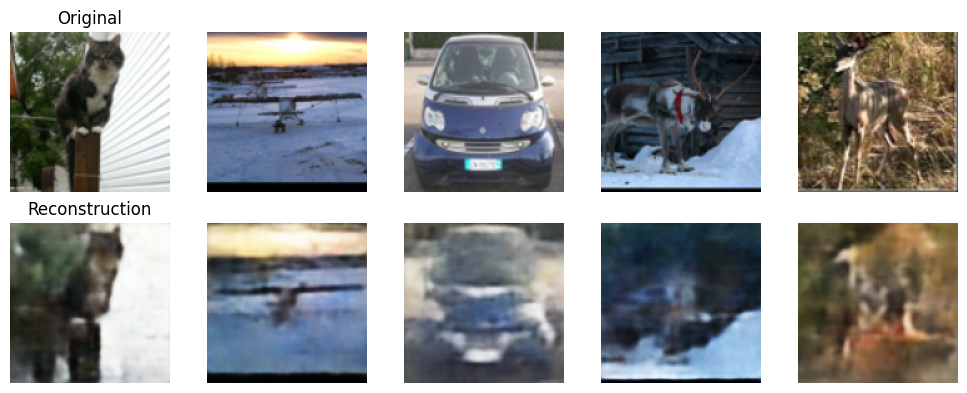

Checkpoint saved to vae_checkpoint.pth


Epoch [151/251] Avg Loss: 561.8989


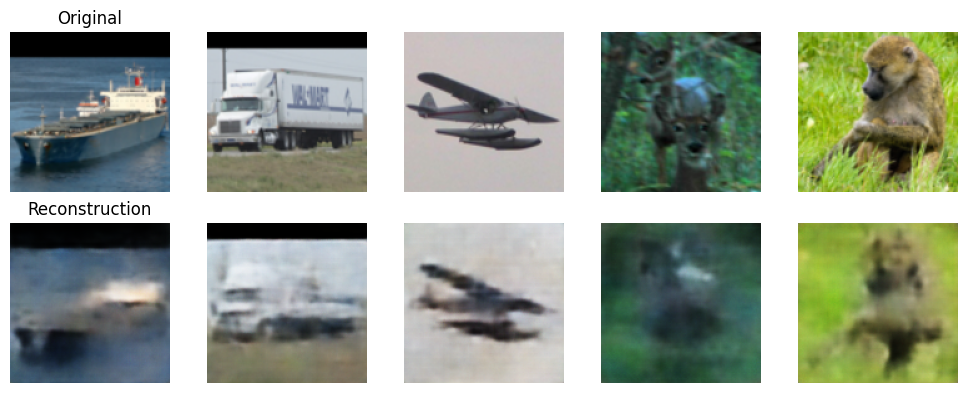

Checkpoint saved to vae_checkpoint.pth


Epoch [161/251] Avg Loss: 561.1091


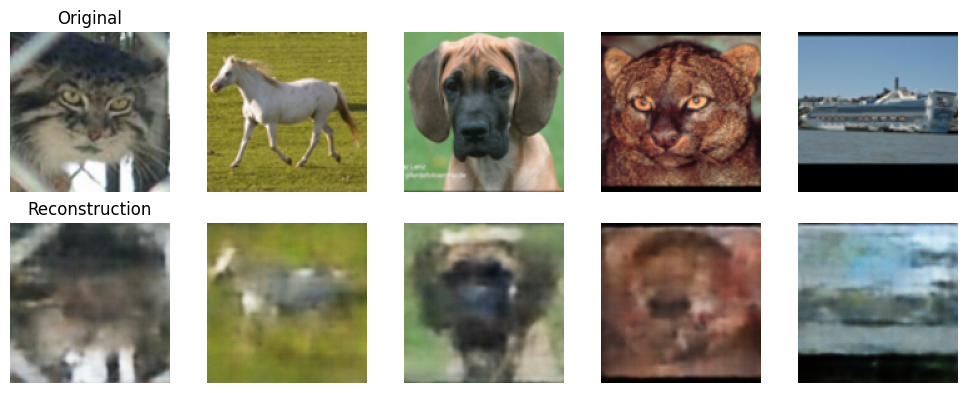

Checkpoint saved to vae_checkpoint.pth


Epoch [171/251] Avg Loss: 545.6746


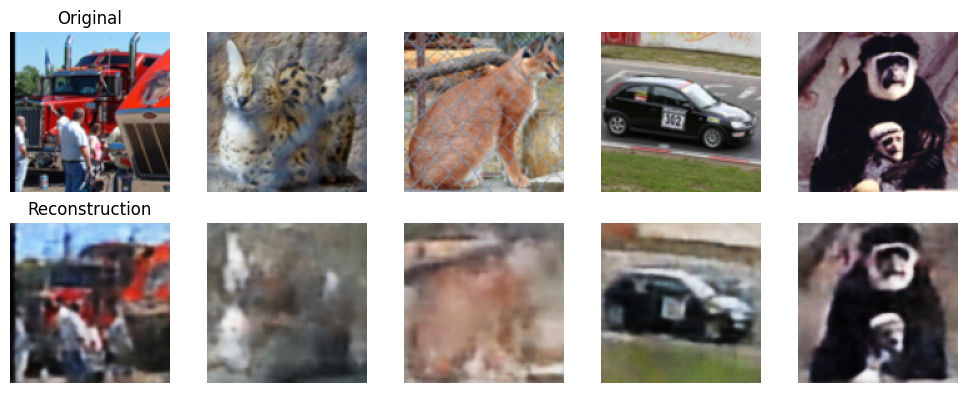

Checkpoint saved to vae_checkpoint.pth


Epoch [181/251] Avg Loss: 534.5777


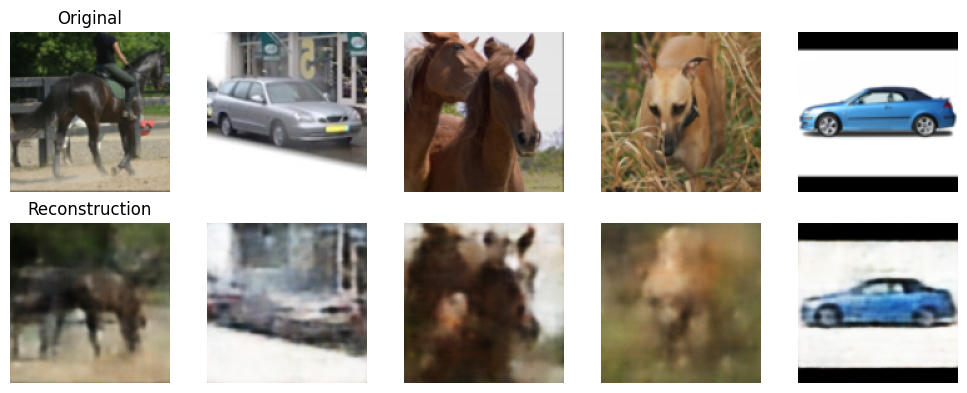

Checkpoint saved to vae_checkpoint.pth


Epoch [191/251] Avg Loss: 522.8514


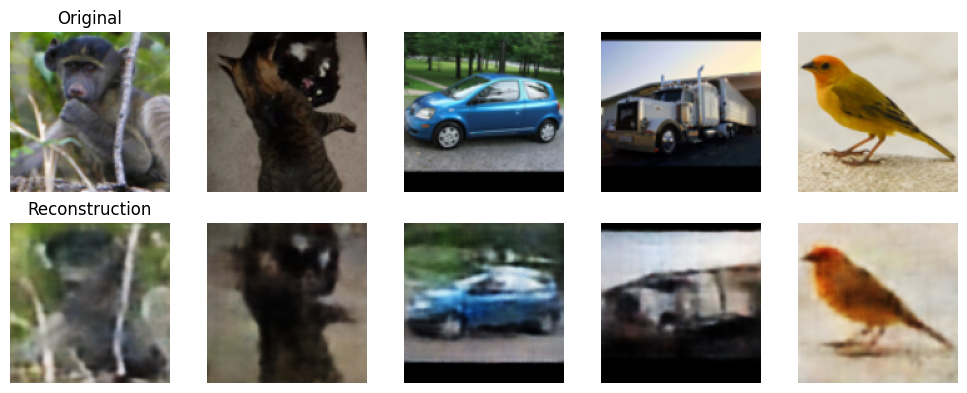

Checkpoint saved to vae_checkpoint.pth


Epoch [201/251] Avg Loss: 514.9477


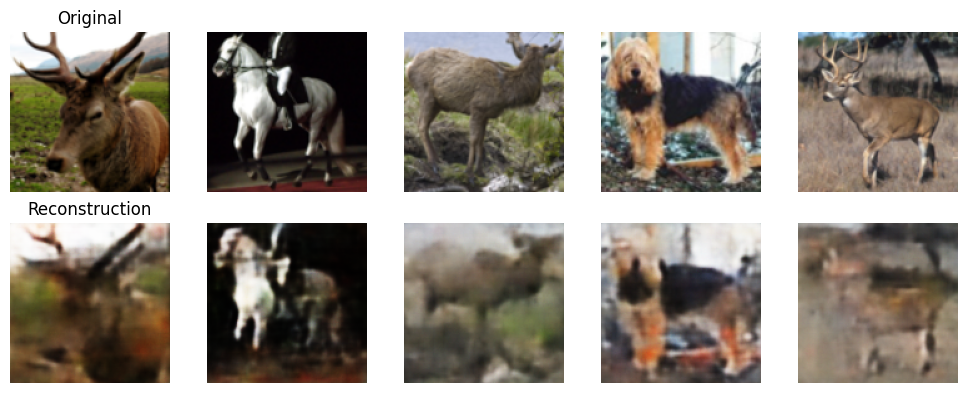

Checkpoint saved to vae_checkpoint.pth


Epoch [211/251] Avg Loss: 511.4360


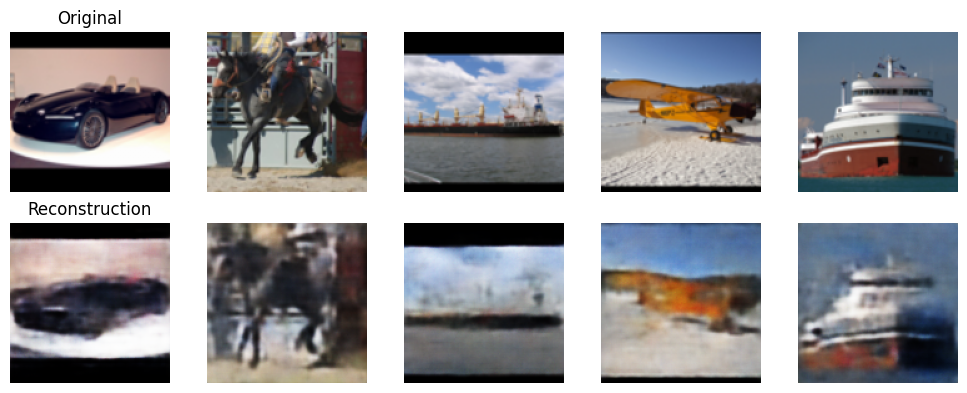

Checkpoint saved to vae_checkpoint.pth


Epoch [221/251] Avg Loss: 504.0196


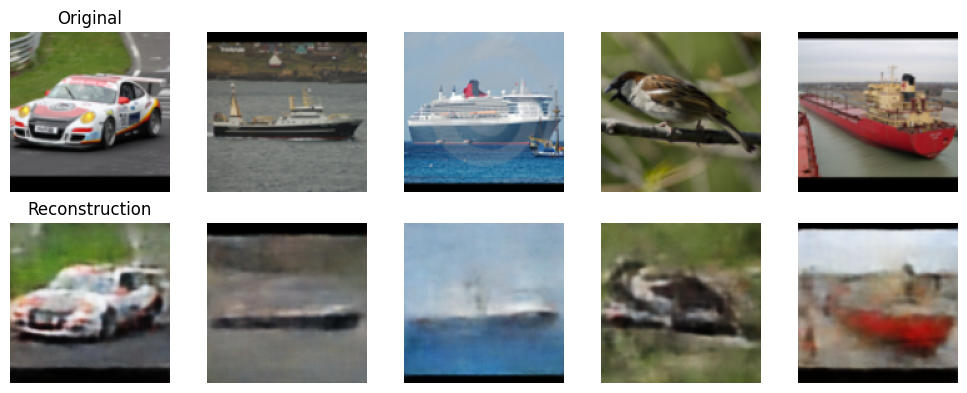

Checkpoint saved to vae_checkpoint.pth


Epoch [231/251] Avg Loss: 522.7754


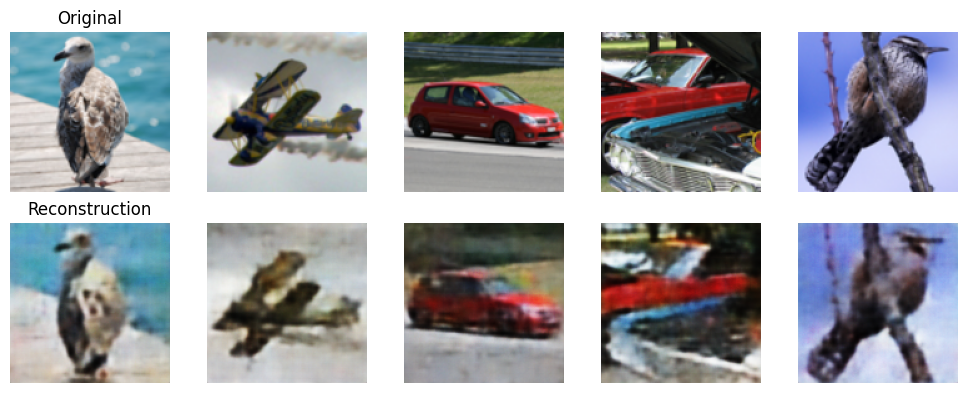

Checkpoint saved to vae_checkpoint.pth


Epoch [241/251] Avg Loss: 498.5765


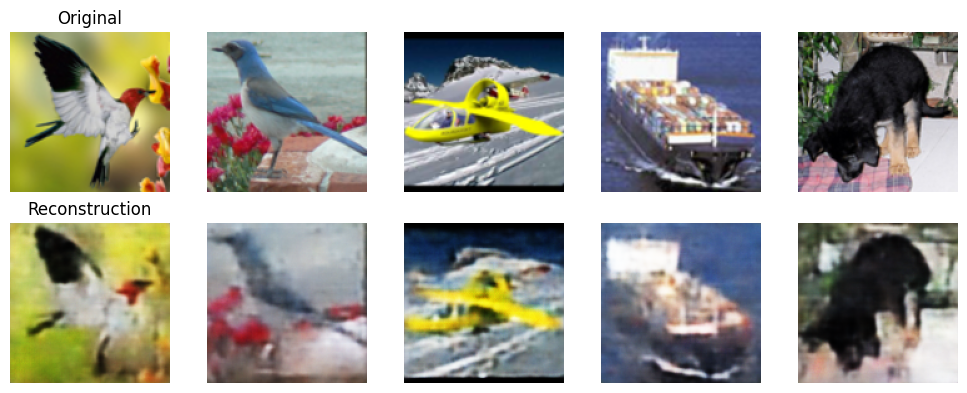

Checkpoint saved to vae_checkpoint.pth


Epoch [251/251] Avg Loss: 483.2096


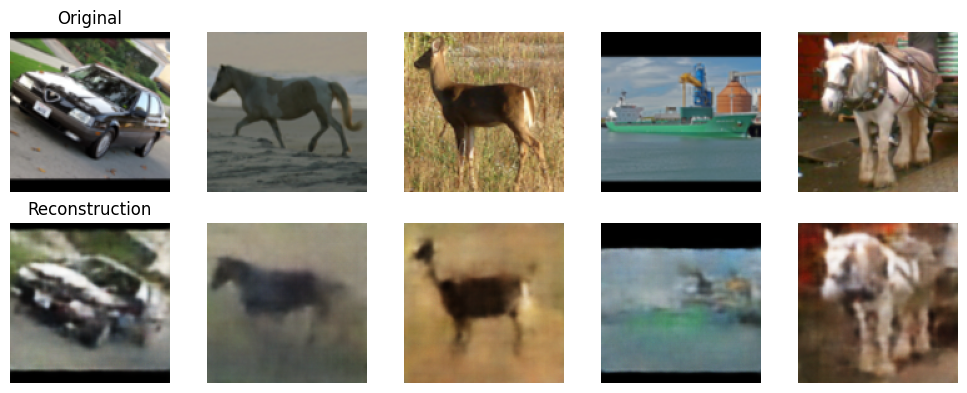

Checkpoint saved to vae_checkpoint.pth


In [15]:
## Inititalize TensorBoard logging
writer = SummaryWriter(log_dir="runs/vae_experiment")

# Train
for epoch in range(1, EPOCHS + 1):
    running_total, running_recon, running_kl = 0.0, 0.0, 0.0
    vae.train()

    progress_bar = tqdm(data_loader, desc=f"Epoch [{epoch}/{EPOCHS}]", leave=False)

    for batch_idx, (images, _) in enumerate(progress_bar):
        images = images.to(DEVICE)
        optimizer.zero_grad()

        reconstructed_images, mean, log_var = vae(images)
        total_loss, reconstructed_loss, kl_loss = loss(
            images, reconstructed_images, mean, log_var,
        )

        total_loss.backward()
        optimizer.step()

        if torch.isnan(total_loss):
            continue

        running_total += total_loss.item()
        running_recon += reconstructed_loss.item()
        running_kl += kl_loss.item()

        progress_bar.set_postfix({
            'Total Loss': f"{total_loss.item():.4f}",
            'Recon': f"{reconstructed_loss.item():.4f}",
            'KL': f"{kl_loss.item():.4f}",
        })

    # Compute average epoch loss
    num_batches = len(data_loader)
    avg_total = running_total / num_batches
    avg_recon = running_recon / num_batches
    avg_kl = running_kl / num_batches

    writer.add_scalar("Loss/Total", avg_total, epoch)
    writer.add_scalar("Loss/Reconstruction", avg_recon, epoch)
    writer.add_scalar("Loss/KL", avg_kl, epoch)

    # Optional logging
    if (epoch - 1) % 10 == 0:
        print(f"Epoch [{epoch}/{EPOCHS}] Avg Loss: {avg_total:.4f}")
        visualize_reconstruction(vae, data_loader, DEVICE, num_samples=5)
        save_checkpoint(vae)

writer.close()


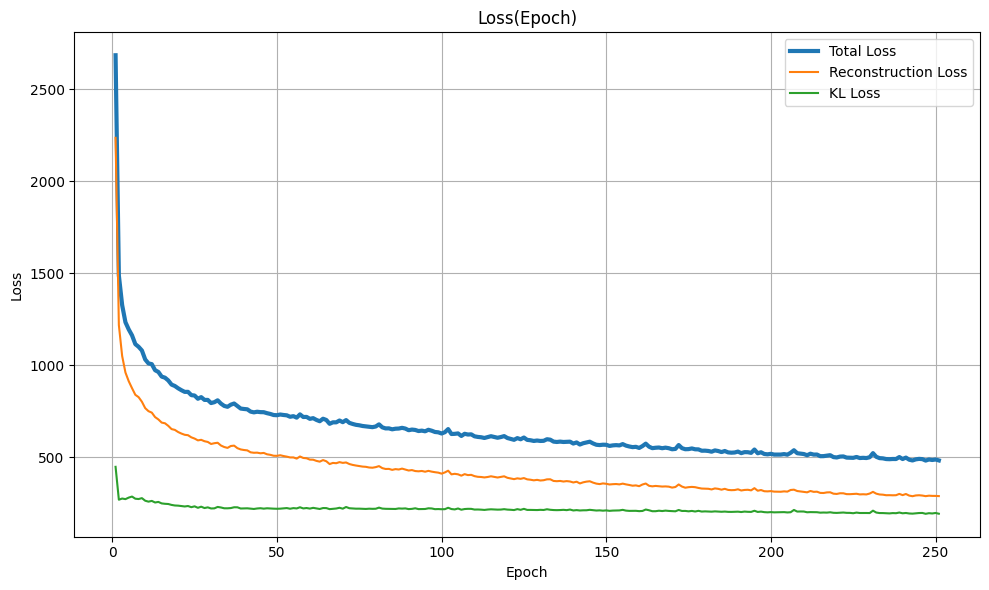

In [16]:
## Plot the loss curve in the notebook
log_dir = "runs/vae_experiment"

event_files = [f for f in os.listdir(log_dir) if f.startswith("events.out")]
event_path = os.path.join(log_dir, sorted(event_files)[-1])

ea = event_accumulator.EventAccumulator(event_path)
ea.Reload()

loss_total = ea.Scalars("Loss/Total")
loss_recon = ea.Scalars("Loss/Reconstruction")
loss_kl = ea.Scalars("Loss/KL")

epochs = [x.step for x in loss_total]
total_vals = [x.value for x in loss_total]
recon_vals = [x.value for x in loss_recon]
kl_vals = [x.value for x in loss_kl]

plt.figure(figsize=(10, 6))
plt.plot(epochs, total_vals, label="Total Loss" , linewidth = 3)
plt.plot(epochs, recon_vals, label="Reconstruction Loss")
plt.plot(epochs, kl_vals, label="KL Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Loss(Epoch)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# Compute average latent vector per class
vae.eval()
class_latents = defaultdict(list)

with torch.no_grad():
    for images, labels in DataLoader(STL10_dataset, batch_size=BATCH_SIZE, shuffle=False):
        images = images.to(DEVICE)
        _ , mu , _ = vae(images) 
        for i, label in enumerate(labels):
            class_latents[label.item()].append(mu[i].cpu())

# Average the latent vectors for each class
average_latents = {}
for class_idx, latents in class_latents.items():
    stacked = torch.stack(latents)
    average_latents[class_idx] = torch.mean(stacked, dim=0)

print(f"Latent vector size: {average_latents[0].shape}")


Latent vector size: torch.Size([512])


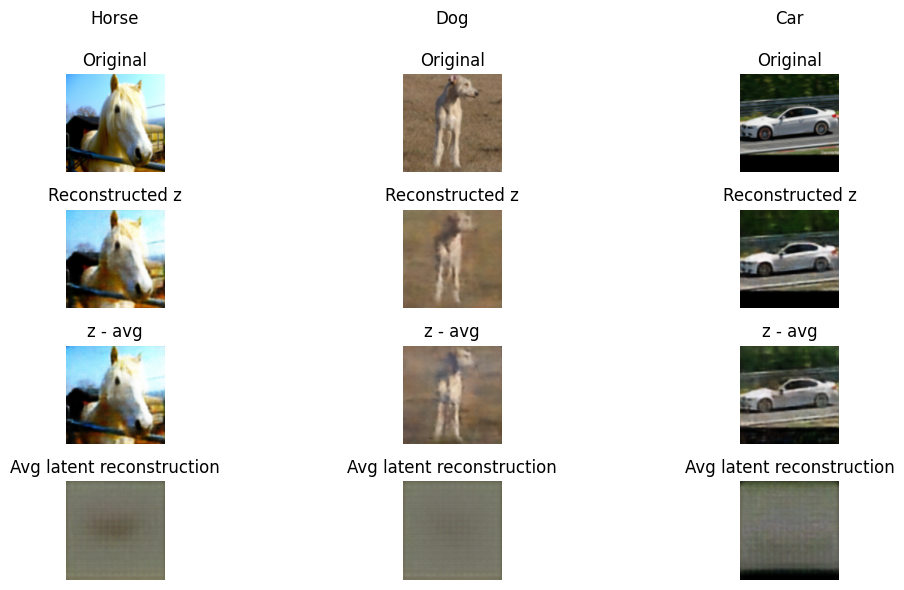

In [57]:

vae.eval()
num_samples = 3
selected_classes = random.sample(range(N), num_samples)

fig, axes = plt.subplots(4, num_samples, figsize=(num_samples * 4, 6))

for i, class_id in enumerate(selected_classes):
    #Pick a random image from class i
    while True:
        idx = random.randint(0, len(STL10_dataset) - 1)
        img, label = STL10_dataset[idx]
        if label == class_id:
            break

    img_input = img.unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        # Encode and get reconstruction
        recon_img, mu, log_var = vae(img_input)

        # Get latent sample z
        z, _, _ = vae.encoder(img_input)

        # Subtract average latent
        residual = z - average_latents[class_id].to(DEVICE)
        # Show the average latent as well
        avg_latent = average_latents[class_id].to(DEVICE)

        # Decode both
        recon_img_np = recon_img.squeeze(0).cpu().permute(1, 2, 0).numpy()
        recon_residual = vae.decode(residual).squeeze(0).cpu().permute(1, 2, 0).numpy()
        average_recon = vae.decode(avg_latent.unsqueeze(0)).squeeze(0).cpu().permute(1, 2, 0).numpy()
        

    axes[0, i].imshow(img.permute(1, 2, 0).numpy())
    axes[0, i].axis('off')
    axes[0, i].set_title(f"{classes[class_id].capitalize()}\n\nOriginal")

    axes[1, i].imshow(recon_img_np)
    axes[1, i].axis('off')
    axes[1, i].set_title("Reconstructed z")

    axes[2, i].imshow(recon_residual)
    axes[2, i].axis('off')
    axes[2, i].set_title("z - avg")

    axes[3, i].imshow(average_recon)
    axes[3, i].axis('off')
    axes[3, i].set_title("Avg latent reconstruction")

plt.tight_layout()
plt.show()


## Explaination

As seen above, the results leave much to be desired. Calculating the average latent representation did not perform well and resulted in extremely blurry reconstructions. This is likely due to the sparsity of the data—the lack of clear trends or structure within each class made it difficult for the autoencoder to learn a meaningful distribution. As a result, the model struggled to generalize and produced poor-quality outputs.

Another dataset, [Stanford Cars](https://huggingface.co/datasets/tanganke/stanford_cars), was also tested using the same approach. The results were similarly underwhelming and can be seen below.


In [77]:
cars_transform = transforms.Compose(
    [
        transforms.Resize((64,64)),
        transforms.ToTensor(),
    ]
)
cars_dataset = ImageFolder(root='../data/stanford-cars/car_data/car_data/train', transform=cars_transform) 

In [78]:
cars = torch.load("./cars.pth", weights_only=False).to(DEVICE) ## Load the trained model (done separately)

In [80]:
class_latents = defaultdict(list)

with torch.no_grad():
    for images, labels in DataLoader(cars_dataset, batch_size=BATCH_SIZE, shuffle=False):
        images = images.to(DEVICE)
        _ , mu , _ = cars(images) 
        for i, label in enumerate(labels):
            class_latents[label.item()].append(mu[i].cpu())

# Average the latent vectors for each class
average_latents = {}
for class_idx, latents in class_latents.items():
    stacked = torch.stack(latents)
    average_latents[class_idx] = torch.mean(stacked, dim=0)

print(f"Latent vector size: {average_latents[0].shape}")


Latent vector size: torch.Size([512])


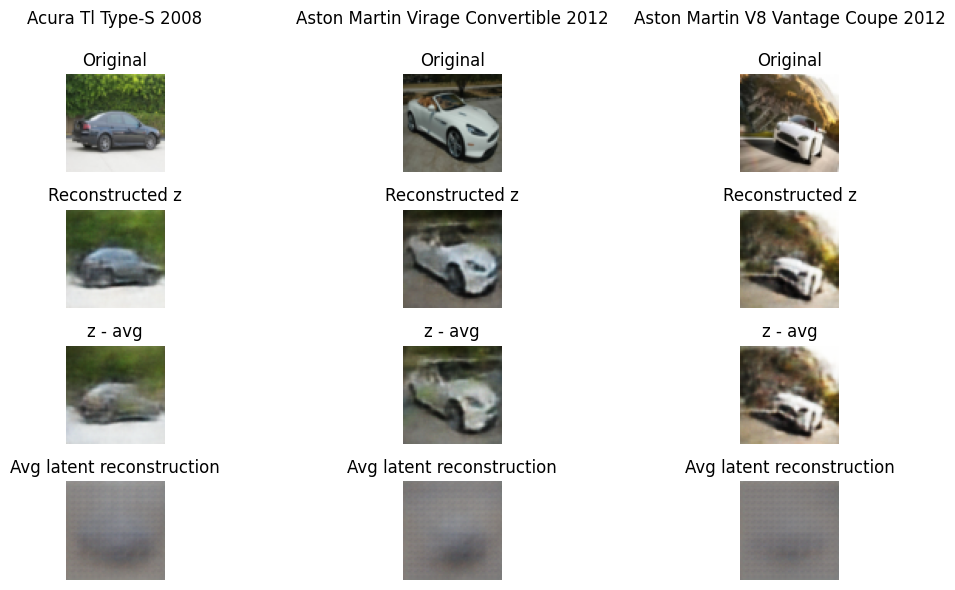

In [84]:

vae.eval()
num_samples = 3
selected_classes = random.sample(range(N), num_samples)

fig, axes = plt.subplots(4, num_samples, figsize=(num_samples * 4, 6))

for i, class_id in enumerate(selected_classes):
    #Pick a random image from class i
    while True:
        idx = random.randint(0, len(cars_dataset) - 1)
        img, label = cars_dataset[idx]
        if label == class_id:
            break

    img_input = img.unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        # Encode and get reconstruction
        recon_img, mu, log_var = cars(img_input)

        # Get latent sample z
        z, _, _ = cars.encoder(img_input)

        # Subtract average latent
        residual = z - average_latents[class_id].to(DEVICE)
        # Show the average latent as well
        avg_latent = average_latents[class_id].to(DEVICE)

        # Decode both
        recon_img_np = recon_img.squeeze(0).cpu().permute(1, 2, 0).numpy()
        recon_residual = cars.decode(residual).squeeze(0).cpu().permute(1, 2, 0).numpy()
        average_recon = cars.decode(avg_latent.unsqueeze(0)).squeeze(0).cpu().permute(1, 2, 0).numpy()
        

    axes[0, i].imshow(img.permute(1, 2, 0).numpy())
    axes[0, i].axis('off')
    axes[0, i].set_title(f"{cars_dataset.classes[class_id].title()}\n\nOriginal")

    axes[1, i].imshow(recon_img_np)
    axes[1, i].axis('off')
    axes[1, i].set_title("Reconstructed z")

    axes[2, i].imshow(recon_residual)
    axes[2, i].axis('off')
    axes[2, i].set_title("z - avg")

    axes[3, i].imshow(average_recon)
    axes[3, i].axis('off')
    axes[3, i].set_title("Avg latent reconstruction")

plt.tight_layout()
plt.show()
